# Результат курсовой работы

## Обучение GAN

In [29]:
import sys
sys.path.append('lib/')
from lib import  CGAN_runners # Библиотека содержащая пакет для обуения

In [32]:
# Набор входных параметров
params = dict()
params['DATASET'] = 'WFDB_PTBXL' #название датасета
params['DATASET_PATH'] = '/large/datasets/openecg/' # путь до  датасета
params['DIAGNOSE']='Dx_164873001' # название диагноза
params['DATASET_FILE'] = 'files/'+params['DATASET']+'/'+params['DIAGNOSE']+'/'+'dataset.npy'
# путь до файла с предобработанными сигналами
params['LOG_FILE'] = 'files/gan_log_flutter_be_res.csv' # путь до файла с логитами
params['IMAGES_PATH']='IMAGES' # путь до папки, где будут храниться изображения 
params['N_LEADS'] = 6 # число каналов у записи ЭКГ
params['WINDOW'] = 8 # размер окна записи (в секундах)
params['NOISE_DIM'] = 128 # глубина шума
params['SR'] = 64 # частота дискретизации
params['HIGH_PASS'] = None # порог высоких частот
params['LOW_PASS'] = 40 # порог низких частот
params['SUBTRACT_RUNNING_MEAN']= 63 # окно для скользящего среднего
params['NUM_EPOCHS'] = 11 # максимальное число эпох обучения
params['BATCH_SIZE'] = 64 # размер батча
params['NUM_WORKERS'] = 0 # количество задействованных процессов, кроме основного
params['NUM_CLASSES']=2 # число классов
params['EPOCHS_TO_DISPLAY'] = 10 # период визуализации и сохранения данных
params['LABELS']='files/'+params['DATASET']+'/'+params['DIAGNOSE']+'/'+'labels.npy' 
# путь до файла с разметкой (номера классов патологий)
params['GEN_EMBEDDING']=128 # Размер embeddings при генерации классов
params['GEN_CHANNELS'] = [32, 64, 128,  128, 64, 32] # размер каналов при обучении генератора
params['GEN_KERNELS'] =  [7, 7, 5, 5, 3, 3] # размер ядер при обучении генератора
params['DIS_CHANNELS'] = [32, 32, 64, 64] #р размер каналов при обучении дискриминатора
params['DIS_KERNELS'] =  [7, 7, 5, 5] # размер ядер свёртки при обучении дискриминатора
params['G_LR']=0.0001 # величина learning rate генератора
params['D_LR']=0.0002 # величина learning rate дискриминатора
params['WEIGHTS'] ='WEIGHTS' # путь до файла с  весами
params['DROPOUT'] = 0.25 # размер dropout для дискриминатора
params['PROPORTION_P'] = 0.5 # пропорция классов при обучении
#DO NOT USE
params['LABELS_TEST']='files/'+params['DATASET']+'/'+params['DIAGNOSE']+'/'+'TEST'+'/'+'labels.npy'
# Путь до тестовой разметки
params['DATASET_FILE_TEST'] ='files/'+params['DATASET']+'/'+params['DIAGNOSE']+'/'+'TEST'+'/'+'dataset.npy'
# Путь до тестовых данных

In [33]:
import json 
with open('params/generator_training.json', 'w') as fp:
    json.dump(params, fp)

In [73]:
# Автоматическое обновление файлов
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
generator = dict()
generator['GENERATOR']='WEIGHTS/epoch_6800.pkl' # Путь до весов генератора
generator['N_LEADS'] = 6 # число каналов у записи ЭКГ
generator['DATASET'] = 'WFDB_PTBXL' #название датасета
generator['DIAGNOSE']='Dx_164873001' # название диагноза
generator['NOISE_DIM'] = 128 # глубина шума
generator['PROPORTION_P'] = 0.5 # пропорция классов при обучении
generator['IMAGES_PATH']='IMAGES' # путь до папки, где будут храниться изображения 
generator['DATASET_FILE'] = 'files/'+generator['DATASET']+'/'+generator['DIAGNOSE']+'/'+'dataset.npy'
# путь до файла с предобработанными сигналами
generator['LABELS']='files/'+generator['DATASET']+'/'+generator['DIAGNOSE']+'/'+'labels.npy' 
# путь до файла с разметкой (номера классов патологий)
generator['NUM_CLASSES']=2 

In [6]:
import json 
with open('params/generator.json', 'w') as fp:
    json.dump(generator, fp)

### Предобработка данных

In [23]:
preload = dict()
preload['DATASET'] = 'WFDB_PTBXL' #название датасета
preload['DATASET_PATH'] = '/large/datasets/openecg/' # путь до  датасета
preload['DIAGNOSE']='Dx_164873001' # название диагноза
preload['LABELS']='files/'+preload['DATASET']+'/'+preload['DIAGNOSE']+'/labels.npy' 
preload['LABELS_TEST']='files/'+preload['DATASET']+'/'+preload['DIAGNOSE']+'/TEST'+'/'+'labels.npy'
preload['DATASET_FILE_TEST'] = 'files/'+preload['DATASET']+'/'+preload['DIAGNOSE']+'/TEST/'+'dataset.npy'
preload['DATASET_FILE'] =  'files/'+preload['DATASET']+'/'+preload['DIAGNOSE']+'/dataset.npy'
preload['SR'] = 64
preload['N_LEADS'] = 6 # число каналов у записи ЭКГ
preload['WINDOW'] = 8 # размер окна записи (в секундах)
preload['HIGH_PASS'] = None # порог высоких частот
preload['LOW_PASS'] = 40 # порог низких частот
preload['SUBTRACT_RUNNING_MEAN']= 63 # окно для скользящего среднего
preload['CROP_METHOD'] = 'center'
preload['PROPORTION_TEST'] = 0.2

In [24]:
import json 
with open('params/preload.json', 'w') as fp:
    json.dump(preload, fp)

In [135]:
CGAN_runners.preload_ds(preload)

100%|██████████| 21837/21837 [01:54<00:00, 190.09it/s]


In [8]:
# Путь до тестовых данных
# CGAN_runners.preload_ds(params)

100%|██████████| 21837/21837 [01:48<00:00, 200.47it/s]


In [9]:
params['LABELS']=params['PATH_2'] + 'files/'+params['DATASET']+'/'+params['DIAGNOSE']+'/6_64/'+'labels.npy' 
params['LABELS_TEST']=params['PATH_2'] + 'files/'+params['DATASET']+'/'+params['DIAGNOSE']+'/6_64/'+'TEST'+'/'+'labels.npy'
# Путь до тестовой разметки
params['DATASET_FILE_TEST'] = params['PATH_2'] + 'files/'+params['DATASET']+'/'+params['DIAGNOSE']+'/6_64/'+'TEST'+'/'+'dataset.npy'
params['DATASET_FILE'] = params['PATH_2'] + 'files/'+params['DATASET']+'/'+params['DIAGNOSE']+'/6_64/'+'dataset.npy'
params['SR'] = 64

In [285]:
# Запуск обучения GAN
CGAN_runners.run_params(params)

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                --                        --
├─ModuleList: 1-1                        --                        --
├─Embedding: 1-2                         [64, 128]                 256
├─UnravelLinear: 1-3                     [64, 64, 536]             --
│    └─Linear: 2-1                       [64, 34304]               8,816,128
│    └─LeakyReLU: 2-2                    [64, 34304]               --
├─ModuleList: 1-1                        --                        --
│    └─Conv1dBlock: 2-3                  [64, 128, 530]            --
│    │    └─Conv1d: 3-1                  [64, 128, 530]            57,344
│    │    └─BatchNorm1d: 3-2             [64, 128, 530]            256
│    │    └─LeakyReLU: 3-3               [64, 128, 530]            --
│    └─Conv1dBlock: 2-4                  [64, 256, 524]            --
│    │    └─Conv1d: 3-4                  [64, 256, 524]            229,3

100%|██████████| 273/273 [00:51<00:00,  5.33it/s]


{'d_loss': 1.3526077497573126, 'g_loss': 0.8136899583723955, 'accuracy': 0.5700669757856774}


100%|██████████| 273/273 [00:51<00:00,  5.30it/s]


{'d_loss': 0.14408467740038813, 'g_loss': 4.304986742389945, 'accuracy': 0.9846012937203046}


Визуализация результатов

In [69]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.rcParams['figure.figsize'] = [300, 60]  # Bigger images
img = mpimg.imread(params['IMAGES_PATH']+'/epoch_10.png')
imgplot = plt.imshow(img)
plt.show()

In [26]:
img = mpimg.imread(params['IMAGES_PATH']+'/epoch_6800.png')
imgplot = plt.imshow(img)
plt.show()

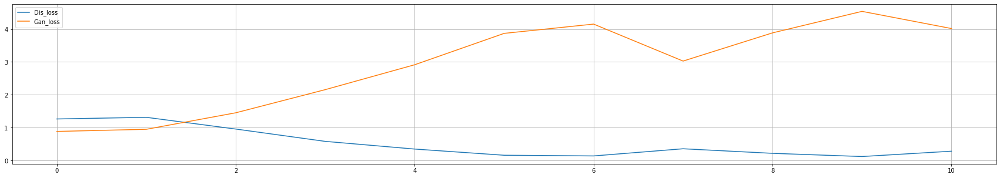

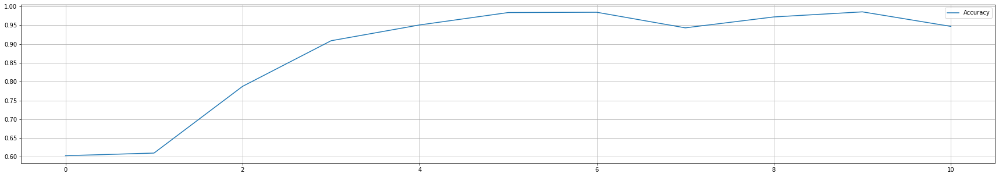

In [55]:
# Визуализация графиков ошибок и Accuracy
log=pd.read_csv(params['LOG_FILE'])
plt.figure(figsize=[30,5])
plt.grid()
plt.plot(log['d_loss'])
plt.plot(log['g_loss'])
plt.legend(['Dis_loss','Gan_loss'])
plt.figure(figsize=[30,5])
plt.grid()
plt.plot(log['accuracy'])
plt.legend(['Accuracy'])
plt.show()

## Обучени классификатора

In [1]:
import sys
import os
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import random
from sklearn.model_selection import train_test_split
import pandas as pd
sys.path.append('lib/')
from dataset_loader import PytorchDS
import model_for_network
import open_datasets
from model_new import train_nn, preload_ds, test_model
from torch.utils.data import DataLoader
plt.rcParams['figure.figsize'] = [30, 5]  # Bigger images

In [144]:
# Параметры для обучения классификатора
params_2=dict()
params_2['DATASET_PATH'] = '/large/datasets/openecg/' # Путь до датасета
params_2['DATASET'] = 'WFDB_PTBXL' # Название датасета
params_2['PATH'] = 'files/' #Путь до предобработанных файлов
params_2['PATH_TEST'] = 'TEST/' # Добавочный путь до папки с тестом
params_2['DIAGNOSE']='Dx_164873001' #Название диагноза
params_2['N_LEADS'] = 6 #Число каналов, совпадает с параметром GAN
params_2['LOG_FILE_RES'] = None # Путь до файла с логитами
# LABELS AND DATASE
params_2['LABELS']='labels.npy' #Название файла с номерами классов
params_2['DATASET_FILE'] = 'dataset.npy' # Название файла с предобработанными данными
# NEURAL NETWORK
params_2['NET_BLOCK'] = 'single' #single, double or triple # Число блоков свёрточной сети
params_2['ENCODER_ACT'] = 'relu' # Функция активации
params_2['DROPOUT'] = 0.3 # Дропоут для классификатора
params_2['BATCH_NORM'] = True # Необходима ли батч-нормализация
params_2['CONV_KERNELS'] = (7, 7, 5, 5, 3, 3) # Размер ядер свёрточной сети
params_2['CONV_CHANNELS'] = [ 32, 64, 96, 128] # Размер каналов свёрточной сети
params_2['LINEAR_CHANNELS'] = [256, 256] # Размер линейного слоя
#processing params_2
params_2['WINDOW'] = 8 #sec # Размер окна в секундах
params_2['CROP_METHOD'] = 'random' #during training, always "center" during test, valid and inference #
# Метод обрезающий участок ЭКГ
params_2['SR'] = 64 # Частота дискретизации (совпадает с параметром GAN)
params_2['HIGH_PASS'] = None # порог высоких частот
params_2['LOW_PASS'] = 40 # порог низких частот
params_2['SUBTRACT_RUNNING_MEAN']= 63 # окно для скользящего среднего
#augmentation params_2
params_2['AUGMENT'] = True # необходима ли аугментация данных
params_2['NOISE_TYPE'] = 'normal' #'uniform' or 'normal' #тип шума, добавляемый при аугментации данных
params_2['NOISE_P'] = 0.5 # Вероятность зашумления канала ЭКГ-сигнала
params_2['NOISE_A'] = 0.05 # Коэффициент амплитуды шума
params_2['CHANNEL_DROP_P'] = 0.15 # Вероятность обнуления канала ЭКГ-сигнала
params_2['PROPORTION_P'] = 0.5 # Пропорция классов
# dataset params_2
params_2['GENERATOR']='WEIGHTS/epoch_6800.pkl' # Путь до весов генератора
params_2['NOISE_DIM'] = 128 # глубина шума (совпадает с параметром GAN)
params_2['LOG_FILE'] = 'log.csv' # Путь до файла с логитами
params_2['PROPORTION'] = 0.3 # Процент сгенерированных данных при обучении
# run  params_2
params_2['lr']=0.001 # learning rate при обучении
params_2['epoches']=300 # максимальное число эпох обучения
# classifier weights
params_2['CLASSIFIER_WEIGHTS'] ='CLASSIFIER' # Путь до папки, где будут сохранены веса классификатора
params_2['CLASSIFIER'] = f'CLASSIFIER/PROPORTION_{params_2["PROPORTION"]}_0/epoch_23.pkl' # Путь до сохранённых весов классификатора

In [145]:
import json 
with open('classifier_training.json', 'w') as fp:
    json.dump(params_2, fp)

In [142]:
# Параметры для обучения классификатора
classifier_test=dict()
classifier_test['DATASET_PATH'] = '/large/datasets/openecg/' # Путь до датасета
classifier_test['DATASET'] = 'WFDB_PTBXL' # Название датасета
classifier_test['PATH'] = 'files/' #Путь до предобработанных файлов
classifier_test['PATH_TEST'] = 'TEST/' # Добавочный путь до папки с тестом
classifier_test['DIAGNOSE']='Dx_164873001' #Название диагноза
# LABELS AND DATASE
classifier_test['LABELS']='labels.npy' #Название файла с номерами классов
classifier_test['DATASET_FILE'] = 'dataset.npy' # Название файла с предобработанными данными
# dataset classifier_test
classifier_test['GENERATOR']='WEIGHTS/epoch_6800.pkl' # Путь до весов генератора
classifier_test['NOISE_DIM'] = 128 # глубина шума (совпадает с параметром GAN)
classifier_test['LOG_FILE_RES'] = 'res.csv' # Путь до файла с логитами
classifier_test['PROPORTION'] = 0.3 # Процент сгенерированных данных при обучении
# classifier weights
classifier_test['CLASSIFIER'] = f'CLASSIFIER/PROPORTION_{classifier_test["PROPORTION"]}/epoch_20.pkl' # Путь до сохранённых весов классификатора

In [143]:
import json 
with open('classifier.json', 'w') as fp:
    json.dump(classifier_test, fp)

In [12]:
# preload_ds(params_2)

100%|██████████| 21837/21837 [01:58<00:00, 184.13it/s]


In [9]:
ecgs = np.load(params_2['DATASET']+'/'+params_2['DIAGNOSE']+'/6_64/'+params_2['DATASET_FILE'])
labels = np.load(params_2['DATASET']+'/'+params_2['DIAGNOSE']+'/6_64/'+params_2['LABELS'])
X_train, X_valid, y_train, y_valid = train_test_split(ecgs, labels, test_size=0.2, random_state=random.randint(15,115), stratify=labels)
train_ds = PytorchDS(X_train, y_train,  params=params_2)
valid_ds = PytorchDS(X_valid, y_valid, params=None)
dataloader_train = DataLoader(train_ds, batch_size=64, shuffle=True)
dataloader_valid = DataLoader(valid_ds, batch_size=64, shuffle=False)

In [14]:
params_2['LOG_FILE'] = f'LOGS/log_{params_2["PROPORTION"]}.csv'
if not os.path.exists(f'CLASSIFIER/PROPORTION_{params_2["PROPORTION"]}'):
    os.makedirs(f'CLASSIFIER/PROPORTION_{params_2["PROPORTION"]}')
    params_2['CLASSIFIER_WEIGHTS'] = params_2['CLASSIFIER_WEIGHTS']+f'/PROPORTION_{params_2["PROPORTION"]}'
net = model_for_network.ECGClassifier(params_2)
train_nn(net, dataloader_train, dataloader_valid, params_2, rand = random.randint(15,115))

  7%|▋         | 22/300 [04:57<1:02:37, 13.52s/it]

ПЕРЕОБУЧЕНИЕ


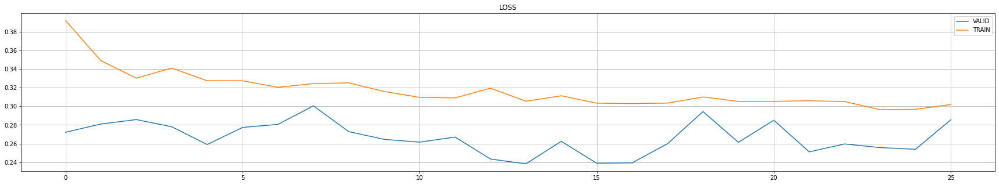

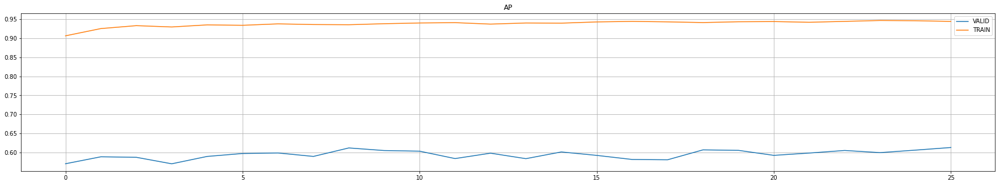

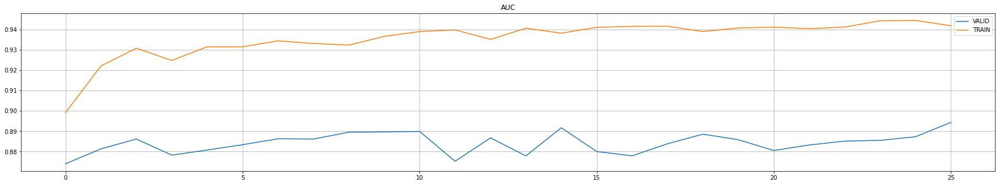

In [40]:
# Визуализация графиков ошибок и Accuracy
log=pd.read_csv(params_2['LOG_FILE'])
plt.figure(figsize=[30,5])
plt.grid()
plt.plot(log['valid_loss'])
plt.plot(log['train_loss'])
plt.legend(['VALID', 'TRAIN'])
plt.title('LOSS')
plt.figure(figsize=[30,5])
plt.grid()
plt.plot(log['valid_ap'])
plt.plot(log['train_ap'])
plt.legend(['VALID', 'TRAIN'])
plt.title('AP')
plt.figure(figsize=[30,5])
plt.grid()
plt.plot(log['valid_auc'])
plt.plot(log['train_auc'])
plt.legend(['VALID', 'TRAIN'])
plt.title('AUC')
plt.show()

## Тестирование классификатора на реальных данных

In [15]:
ecgs_test = np.load(params_2['PATH']+params_2['DATASET']+'/'+params_2['DIAGNOSE']+'/6_64/'+params_2['PATH_TEST']+params_2['DATASET_FILE'])
labels_test = np.load(params_2['PATH']+params_2['DATASET']+'/'+params_2['DIAGNOSE']+'/6_64/'+params_2['PATH_TEST']+params_2['LABELS'])
test_ds = PytorchDS(ecgs_test, labels_test, params=None)
dataloader_test = DataLoader(test_ds, batch_size=128, shuffle=False)

In [29]:
test_model(params = classifier_test)

{'valid_loss': 0.3101584553718567,
 'valid_ap': 0.4005880603169335,
 'valid_auc': 0.7238492108377128}

In [28]:
test_model(params = 'classifier.json')

{'valid_loss': 0.3074295248304095,
 'valid_ap': 0.41047724992803736,
 'valid_auc': 0.7322367791389691}

In [33]:
result = pd.read_csv('preds.csv')
result

,preds
0,0.041014
1,0.129063
2,0.097861
3,0.119909
4,0.265331
...,...
4363,0.037471
4364,0.491905
4365,0.006207
4366,0.268330


In [17]:
final = dict()
final['FILE'] = 'data/'
# final['FILE'] = '/large/datasets/openecg/WFDB_PTBXL/'
final['SR'] = 64 # Частота дискретизации (совпадает с параметром GAN)
final['HIGH_PASS'] = None # порог высоких частот
final['LOW_PASS'] = 40 # порог низких частот
final['SUBTRACT_RUNNING_MEAN']= 63 # окно для скользящего среднего
final['N_LEADS'] = 6
final['WINDOW'] = 8 #sec # Размер окна в секундах
final['CROP_METHOD'] = 'random' #during training, always "center" during test, valid and inference 
final['GENERATOR']='WEIGHTS/epoch_6800.pkl' # Путь до весов генератора
# final['PROPORTION'] = 0.3
final['CLASSIFIER'] = f'CLASSIFIER/PROPORTION_0.3/epoch_20.pkl'
final['RESULT'] = 'result.csv'
final['PATH_TO_LIB'] = 'lib/'

In [18]:
import json 
with open('params/main.json', 'w') as fp:
    json.dump(final, fp)